# Assignment 2
## Part 1: Fourier-based Color Channel Alignment
Mohammad Rashiqul Alam  
malam25@illinois.edu  

In [1]:
# Modules
import os
import time
import numpy as np
import matplotlib.pyplot as plt
from   PIL import Image
from scipy.ndimage import gaussian_filter, gaussian_laplace


## Image Pre-Processing

### Import All Images
Import low-resolution images from ~/data/  
Import high-resolution images from ~/data_hires/

**Notebook assumes both data and data_hires directories are in the same level as the notebook!

In [2]:
# Remove borders
def remove_borders(channel, border_percent):
    height, width = channel.shape
    bh = int(height * border_percent)
    bw = int(width * border_percent)
    return channel[bh:height-bh, bw:width-bw]

def load_and_split_image(directory, filename, hires=False, border_percent=0.08):
    """
    Load an image, normalize, split into top/middle/bottom, and remove borders.
    Args:
        directory (str): Directory path.
        filename (str): Image filename.
        hires (bool): True for high-res (.tif), False for low-res (.jpg).
        border_percent (float): Border percentage to crop.
    Returns:
        (top, middle, bottom): Cropped slices as numpy arrays.
    """

    # Load image and normalize
    path = os.path.join(directory, filename)
    image = Image.open(path)
    if hires:
        image_array = np.array(image) / 65535.0
    else:
        image = image.convert('L')
        image_array = np.array(image) / 255.0

    # Split into slices
    h = image_array.shape[0]
    h_per = h // 3
    top    = image_array[0 : h_per, :]
    middle = image_array[h_per : 2*h_per, :]
    bottom = image_array[2*h_per : 3*h_per, :]

    top    = remove_borders(top, border_percent)
    middle = remove_borders(middle, border_percent)
    bottom = remove_borders(bottom, border_percent)

    return top, middle, bottom

In [3]:
# Define directories
data_dir = os.path.join(os.getcwd(), "data")
data_hires_dir = os.path.join(os.getcwd(), "data_hires")

# List all image files
image_files_low_res = [f for f in os.listdir(data_dir) if f.endswith('.jpg')]
image_files_high_res = [f for f in os.listdir(data_hires_dir) if f.endswith('.tif')]

# Extract slices for low-resolution images
low_res_slices = []
for filename in image_files_low_res:
    top, middle, bottom = load_and_split_image(data_dir, filename, hires=False)
    low_res_slices.append((top, middle, bottom))

# Extract slices for high-resolution images
high_res_slices = []
for filename in image_files_high_res:
    top, middle, bottom = load_and_split_image(data_hires_dir, filename, hires=True)
    high_res_slices.append((top, middle, bottom))

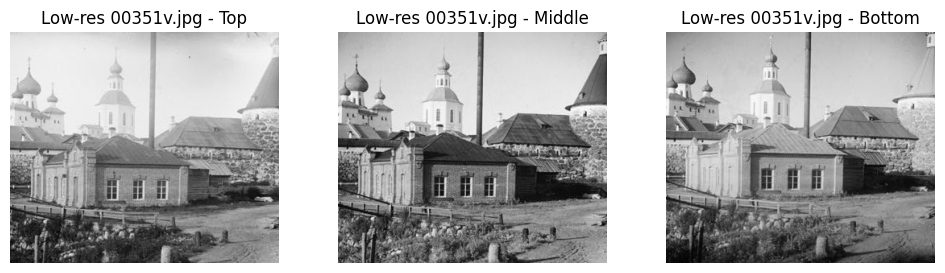

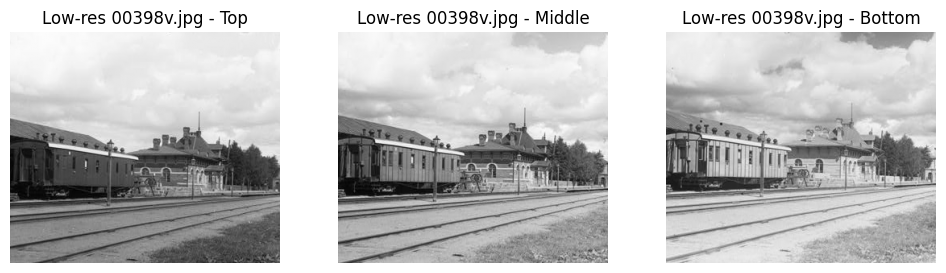

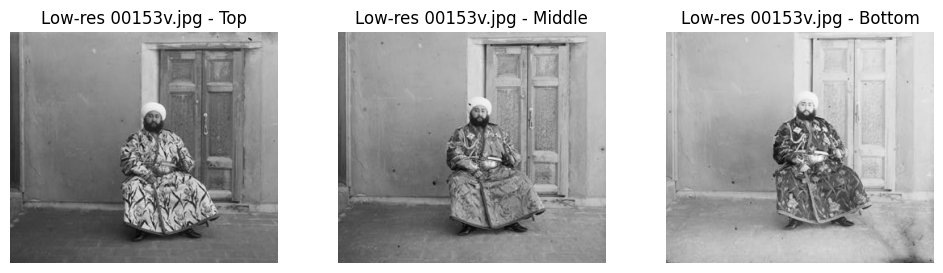

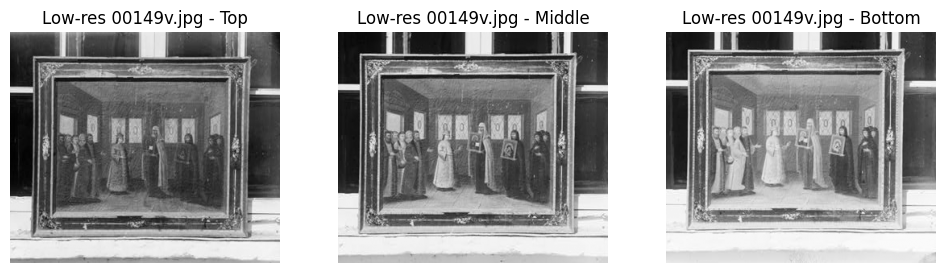

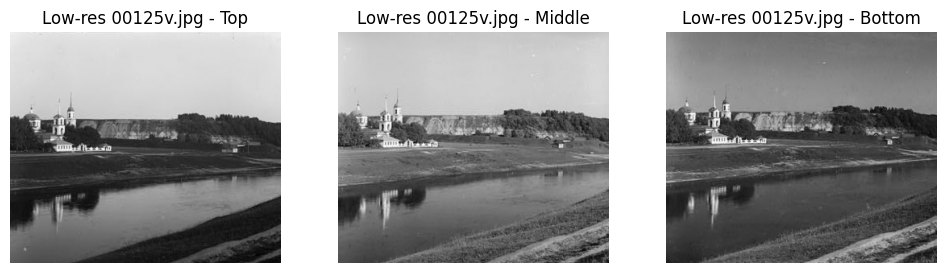

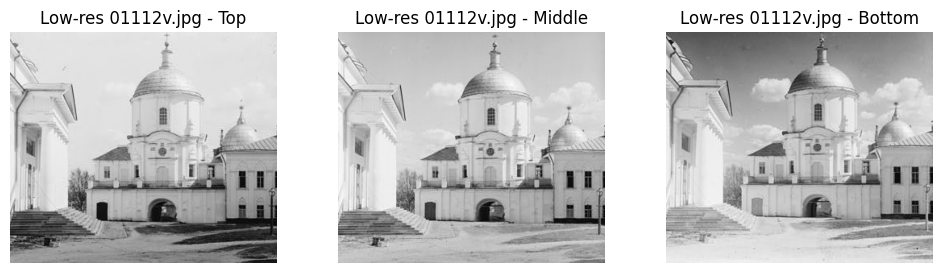

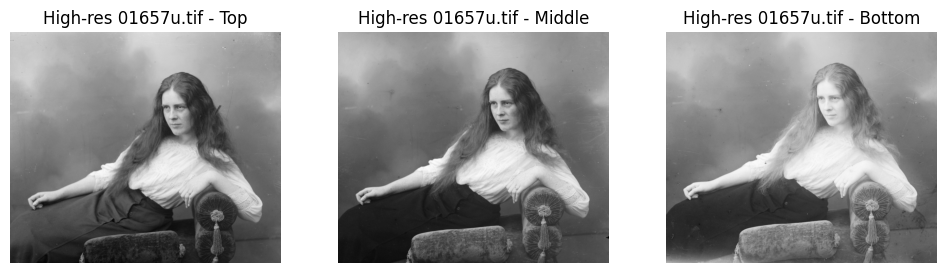

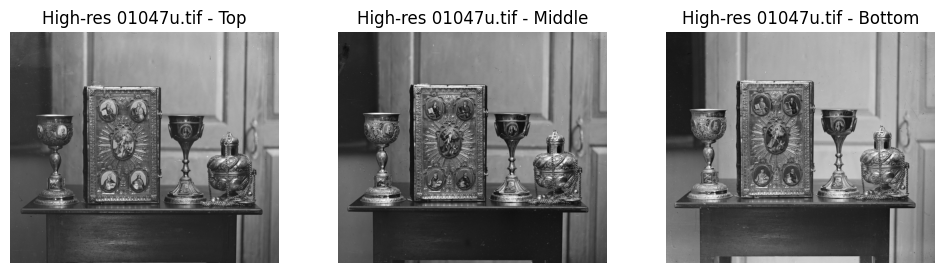

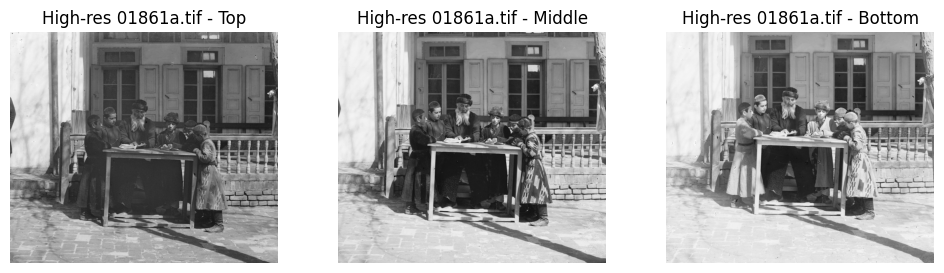

In [4]:
# Plot low-resolution slices next to each other
for i, (top, middle, bottom) in enumerate(low_res_slices):
    plt.figure(figsize=(12, 3))
    plt.subplot(1, 3, 1)
    plt.imshow(top, cmap='gray')
    plt.title(f'Low-res {image_files_low_res[i]} - Top')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(middle, cmap='gray')
    plt.title(f'Low-res {image_files_low_res[i]} - Middle')
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(bottom, cmap='gray')
    plt.title(f'Low-res {image_files_low_res[i]} - Bottom')
    plt.axis('off')
    plt.show()

# Plot high-resolution slices next to each other
for i, (top, middle, bottom) in enumerate(high_res_slices):
    plt.figure(figsize=(12, 3))
    plt.subplot(1, 3, 1)
    plt.imshow(top, cmap='gray')
    plt.title(f'High-res {image_files_high_res[i]} - Top')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(middle, cmap='gray')
    plt.title(f'High-res {image_files_high_res[i]} - Middle')
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(bottom, cmap='gray')
    plt.title(f'High-res {image_files_high_res[i]} - Bottom')
    plt.axis('off')
    plt.show()

### Fast Fourier Transform Alignment Algorithm
- Compute fourier transforms:
    - Take the FFT on the input channels of the image.
    - For e.g. F_base and F_target.
- Form cross-power spectrum:
    - Compute the product of top_FT1 and complex conjugate of bottom_FT2.
- Inverse transform to correlation space.
    - Take the inverse FFT of the above product to obtain the cross-correlation surface.
- Find the displacement:
    - Locate the position of the maximum value in the correlation surface.
    - This position gives the relative shift (offset) between top and bottom channels.
- Align all channels:
    - Using the mid channel as reference base:
        - Align Top -> Mid
        - Align Bottom -> Mid
- Stack aligned channels:
    - Apply the computed offsets to top and bottom, then stack the channels to form the algined color image


In [5]:
# Define the Fourier shift correlation function for finding the displacement between two channels
def fourier_shift_correlation(base, target, visualize_corr=False, title_prefix=""):
    """
    Function that:
     - Computes the Fourier shift correlation between base channel and the target channel.
     - Visualizes the inverse FFT (cross-correlation map).
    Parameters:
        base: The base (reference) channel (2D array).
        target: The target channel (2D array).
        visualize_corr: Flag to visualize the correlation map.
        title_prefix: Title prefix for the visualization.
    Returns:
        The shift in a tuple (dy, dx) needed to align target to base.
    """
    # Ensure inputs are float32 for FFT
    base_f   = base.astype(np.float32, copy=False)
    target_f = target.astype(np.float32, copy=False)

    # Perform fourier transform
    FT1 = np.fft.fft2(base_f)
    FT2 = np.fft.fft2(target_f)

    # Multiply by conjugate
    product = FT1 * np.conjugate(FT2)

    # Inverse FFT
    corr = np.fft.ifft2(product)
    # Compute magnitude
    corr_mag = np.abs(corr)
    
    # Visualization (fftshift ONLY for plotting)
    if visualize_corr:
        plt.figure(figsize=(6,5))
        corr_plot = np.fft.fftshift(corr_mag)
        # Use log scale for better visibility
        corr_plot_log = np.log1p(corr_plot)
        im = plt.imshow(corr_plot_log, cmap='gray', aspect='auto')
        plt.title(f"{title_prefix} Cross-Correlation Map\n(Peak = alignment offset)")
        plt.xlabel("X shift (pixels)")
        plt.ylabel("Y shift (pixels)")
        plt.colorbar(im, label="Correlation magnitude (log scale)")
        plt.tight_layout()
        plt.show()

    # Get the shape of the correlation map
    H, W = corr_mag.shape

    # Find the peak in the correlation map
    # Use np.unravel_index as we need 2D coordinates from the flattened index
    # It returns (row, col) which corresponds to (y, x)
    peak_row, peak_col = np.unravel_index(np.argmax(corr_mag), corr_mag.shape)

    # Compute displacements considering wrap-around
    # Wrap around logic is to handle shifts if greater than half the image size
    dy = peak_row if peak_row <= H // 2 else peak_row - H
    dx = peak_col if peak_col <= W // 2 else peak_col - W
    # Return negative shifts to align target to base
    # The negative sign is because we want to know how much to move the target to align with the base
    return (-int(dy), -int(dx)), corr_plot_log

In [6]:
# Function to align channels and form color images
def align_and_form_color_images(slices_list, visualize_corr=False, image_filenames=None):
    """
    Function that:
    - Aligns the top and bottom slices to the middle slice.
    - Stacks them into RGB images.
    Parameters:
        slices_list: List of tuples (top, middle, bottom).
        visualize_corr: Flag to visualize correlation maps during alignment.
    Returns:
        color_images: List of aligned RGB images.
        shifts: List of dictionaries with shifts applied for each image.
    """
    color_images = []
    shifts = []
    spectra = []
    
    # For each (top, middle, bottom):
    for idx, (top, middle, bottom) in enumerate(slices_list):

        # Measure the time taken for alignment of high-resolution images
        start_time = time.time()
        
        # Use filename if provided, else fallback to index
        if image_filenames is not None:
            img_name = image_filenames[idx]
        else:
            img_name = f"Image {idx+1}"

        # Find the shift for top relative to middle
        (shift_top, top_spectrum) = fourier_shift_correlation(
            middle, top, visualize_corr=visualize_corr, 
            title_prefix=f"{img_name} | B→G"
        )
        
        # Find the shift for bottom relative to middle
        (shift_bottom, bottom_spectrum) = fourier_shift_correlation(
            middle, bottom, visualize_corr=visualize_corr, 
            title_prefix=f"{img_name} | R→G"
        )

        # Extract shifts
        dy_b, dx_b = shift_top
        dy_r, dx_r = shift_bottom

        # Apply the shifts
        # Use np.roll to shift the channels by the computed displacements
        top_aligned    = np.roll(top,    shift=(-dy_b, -dx_b), axis=(0,1))
        bottom_aligned = np.roll(bottom, shift=(-dy_r, -dx_r), axis=(0,1))
        middle_aligned = middle

        # Stack into RGB (bottom=R, middle=G, top=B)
        # From assignment1 we already know the channel order
        rgb = np.dstack([bottom_aligned, middle_aligned, top_aligned])
        # Append the RGB image to the list
        color_images.append(rgb)
        # Append the shifts to the list
        shifts.append({"B->G": (dy_b, dx_b), "R->G": (dy_r, dx_r)})
        # Append the spectra for potential further analysis
        spectra.append((top_spectrum, bottom_spectrum))

        end_time = time.time()
        print(f"Time taken for high-resolution image alignment: {end_time - start_time:.2f} seconds")

    # Return the color images and shifts
    return color_images, shifts, spectra

### Perform Alginment for Low-Resolution Images 

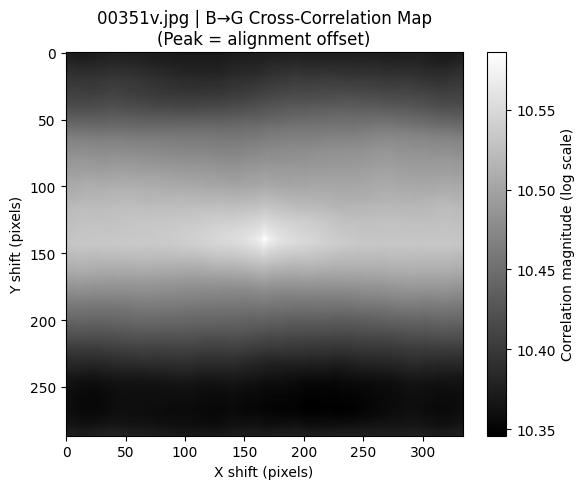

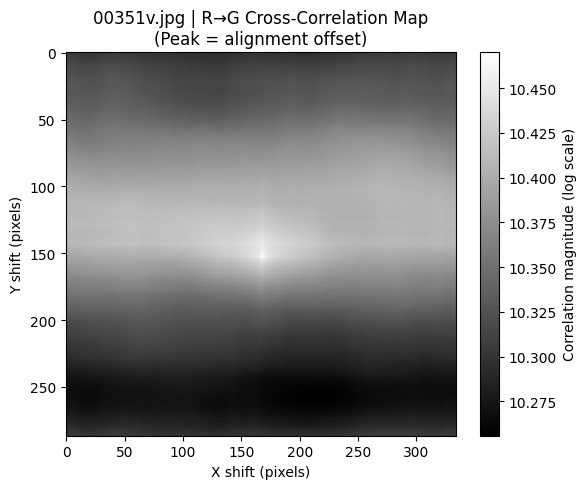

Time taken for high-resolution image alignment: 0.12 seconds


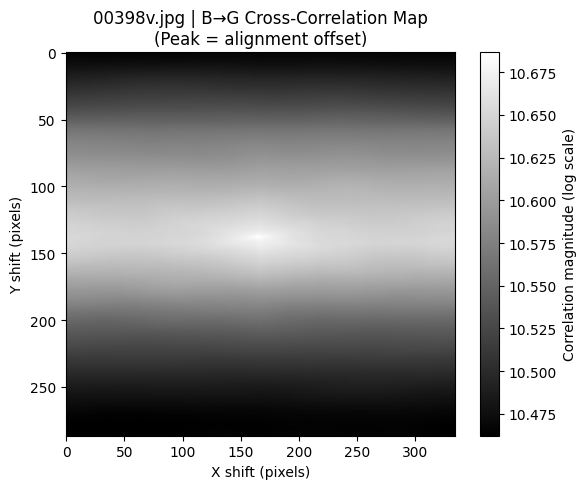

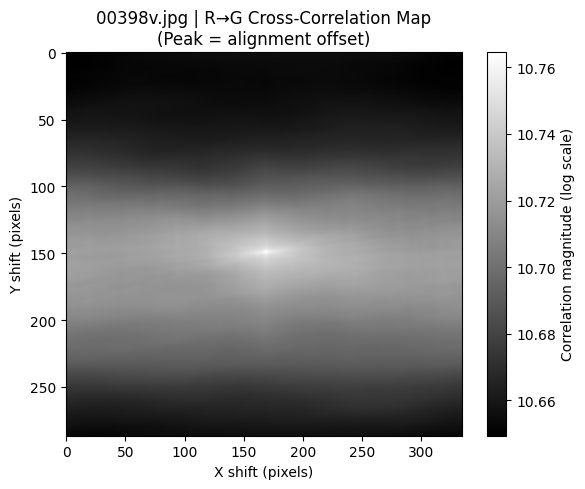

Time taken for high-resolution image alignment: 0.12 seconds


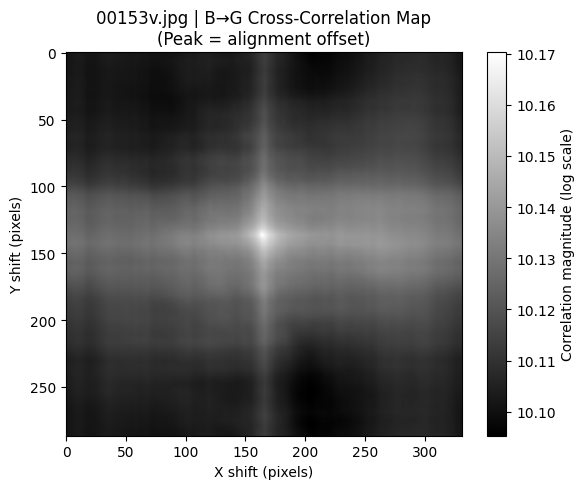

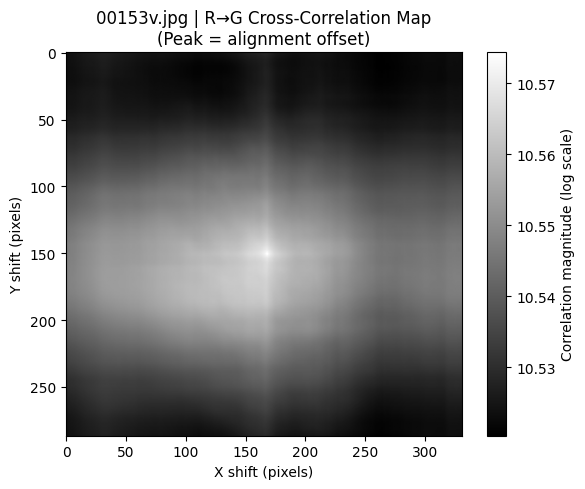

Time taken for high-resolution image alignment: 0.16 seconds


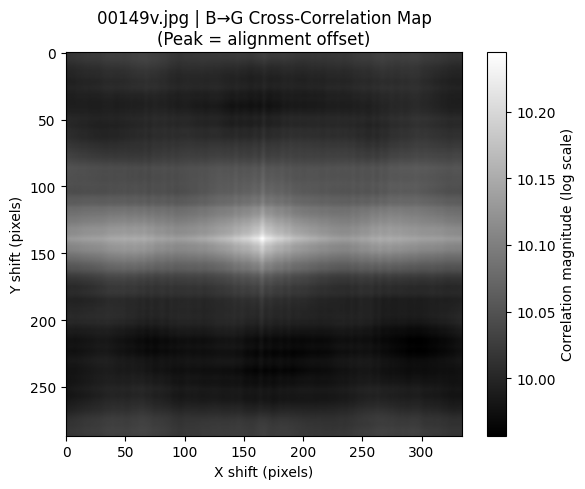

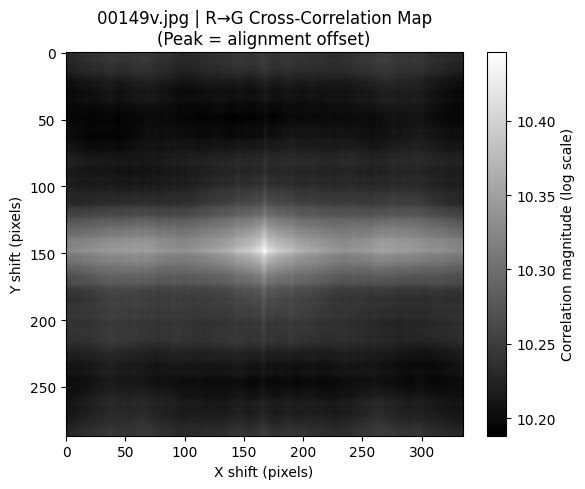

Time taken for high-resolution image alignment: 0.13 seconds


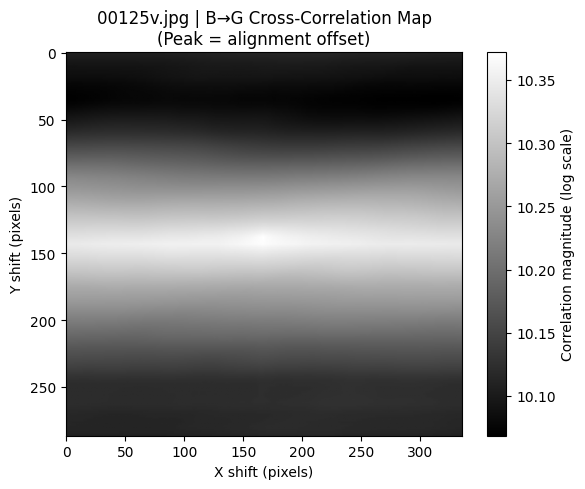

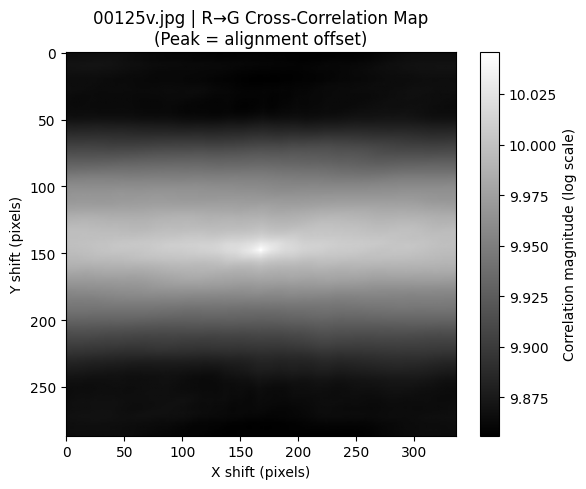

Time taken for high-resolution image alignment: 0.12 seconds


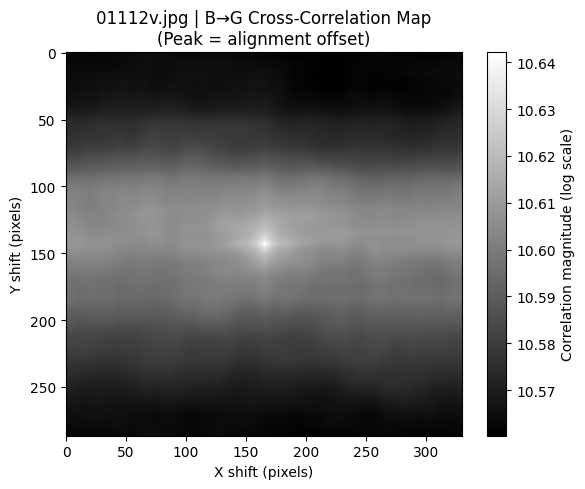

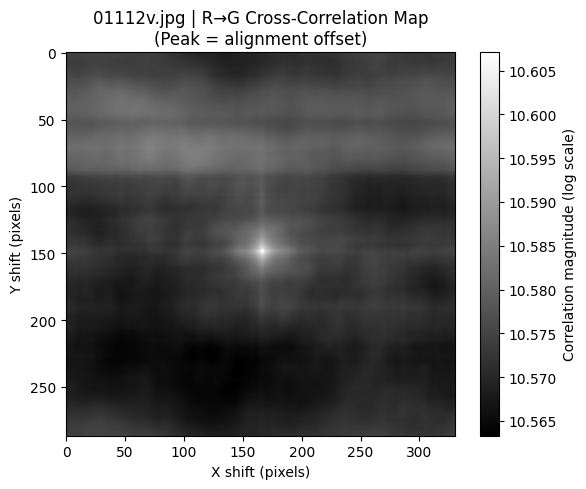

Time taken for high-resolution image alignment: 0.13 seconds
00351v.jpg shifts: {'B->G': (4, 1), 'R->G': (-9, -1)}


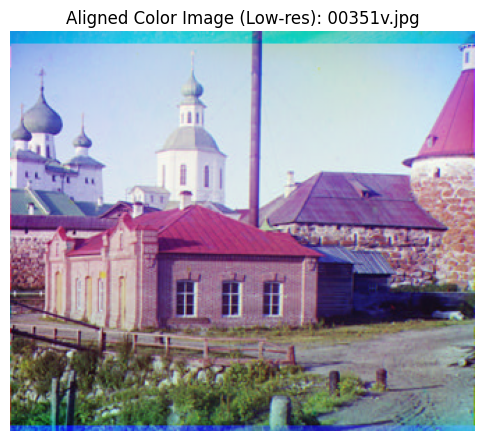

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00351v_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00351v_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00351v_bottom_spectrum.png
00398v.jpg shifts: {'B->G': (5, 3), 'R->G': (-6, -1)}


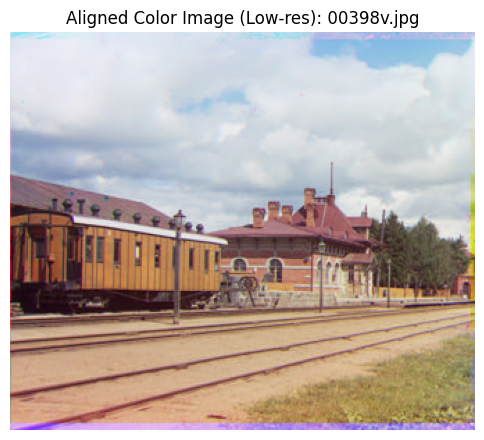

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00398v_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00398v_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00398v_bottom_spectrum.png
00153v.jpg shifts: {'B->G': (7, 2), 'R->G': (-7, -2)}


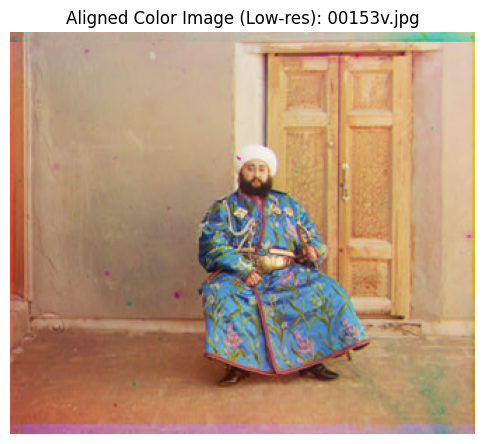

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00153v_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00153v_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00153v_bottom_spectrum.png
00149v.jpg shifts: {'B->G': (4, 2), 'R->G': (-5, 0)}


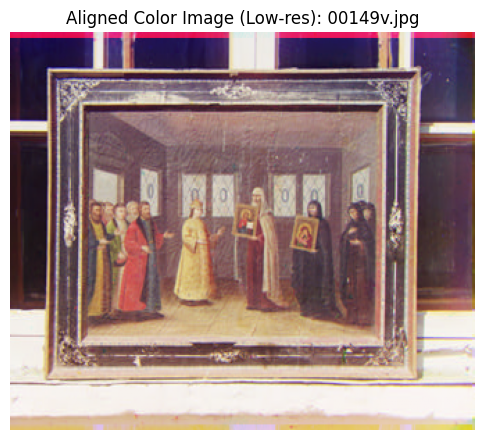

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00149v_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00149v_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00149v_bottom_spectrum.png
00125v.jpg shifts: {'B->G': (5, 2), 'R->G': (-4, 1)}


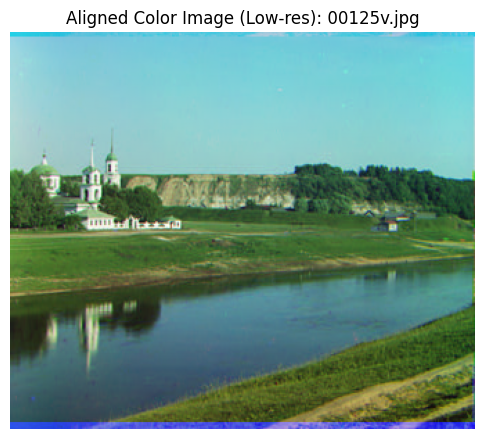

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00125v_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00125v_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/00125v_bottom_spectrum.png
01112v.jpg shifts: {'B->G': (0, 0), 'R->G': (-5, -1)}


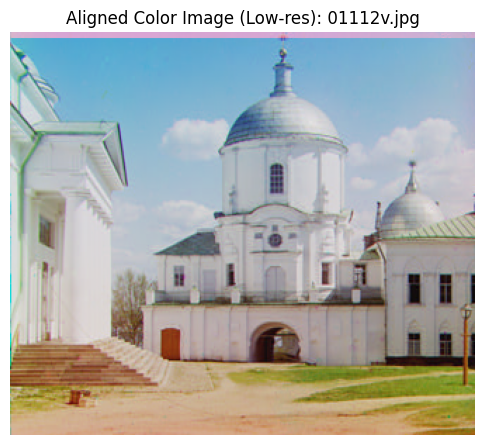

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/01112v_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/01112v_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/01112v_bottom_spectrum.png


In [7]:
# Align and form color images for low-resolution images
aligned_low_res_images, low_res_shifts, low_res_spectra = align_and_form_color_images(
    low_res_slices, visualize_corr=True, image_filenames=image_files_low_res
)

# Get parent directory (one above current working directory)
parent_dir = os.path.dirname(os.getcwd())
output_dir = os.path.join(parent_dir, "Gen", "a2", "part1", "lowres_rgb")
os.makedirs(output_dir, exist_ok=True)

# Display aligned low-resolution color images and their shifts
for i, color_image in enumerate(aligned_low_res_images):
    plt.figure(figsize=(6,6))
    plt.imshow(color_image)
    plt.title(f"Aligned Color Image (Low-res): {image_files_low_res[i]}")
    plt.axis('off')
    print(f"{image_files_low_res[i]} shifts:", low_res_shifts[i])
    plt.show()

    # Save RGB as .jpeg in Gen/a2/lowres_rgb
    out_path = os.path.join(output_dir, f"{image_files_low_res[i].replace('.jpg', '_aligned.jpg')}")
    out_img  = (color_image * 255).clip(0,255).astype(np.uint8)
    out_pil  = Image.fromarray(out_img)
    out_pil.save(out_path, format='JPEG')
    print(f"Saved: {out_path}")
    
    # Get the corresponding spectra
    top_spectrum, bottom_spectrum = low_res_spectra[i]
    
    # Save correlation spectrum as PNG with axes and colorbar (Top→Mid)
    plt.figure(figsize=(6,5))
    plt.imshow(top_spectrum, cmap='gray', aspect='auto')
    plt.title(f"R->G Shift: {low_res_shifts[i]['R->G']} Cross-Correlation\n(Peak = alignment offset)")
    plt.xlabel("X shift (pixels)")
    plt.ylabel("Y shift (pixels)")
    plt.colorbar(label="Correlation magnitude (log scale)")
    plt.tight_layout()
    png_path = os.path.join(output_dir, f"{image_files_low_res[i].replace('.jpg', '_top_spectrum.png')}")
    plt.savefig(png_path)
    plt.close()
    print(f"Saved Top Spectrum: {png_path}")

    # Save correlation spectrum as PNG with axes and colorbar (Bottom→Mid)
    plt.figure(figsize=(6,5))
    plt.imshow(bottom_spectrum, cmap='gray', aspect='auto')
    plt.title(f"B->G Shift: {low_res_shifts[i]['B->G']} Cross-Correlation\n(Peak = alignment offset)")
    plt.xlabel("X shift (pixels)")
    plt.ylabel("Y shift (pixels)")
    plt.colorbar(label="Correlation magnitude (log scale)")
    plt.tight_layout()
    png_path = os.path.join(output_dir, f"{image_files_low_res[i].replace('.jpg', '_bottom_spectrum.png')}")
    plt.savefig(png_path)
    plt.close()
    print(f"Saved Bottom Spectrum: {png_path}")



### Perform Alignment for High Resolution Images

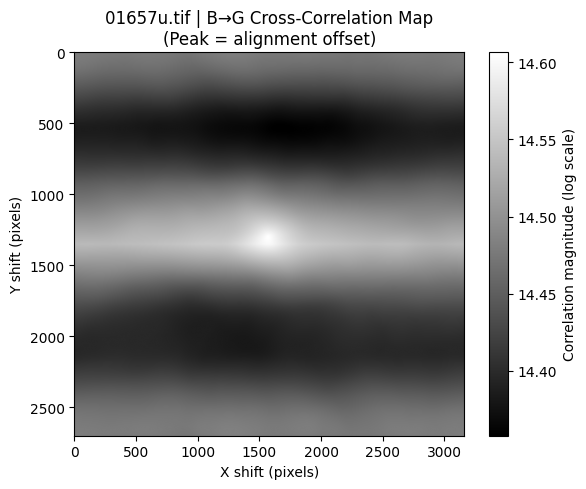

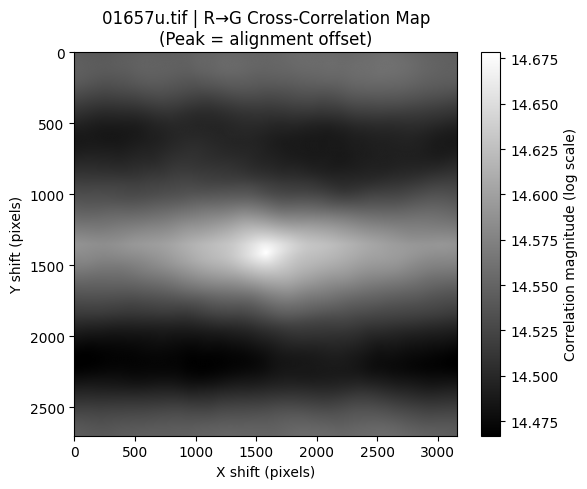

Time taken for high-resolution image alignment: 1.84 seconds


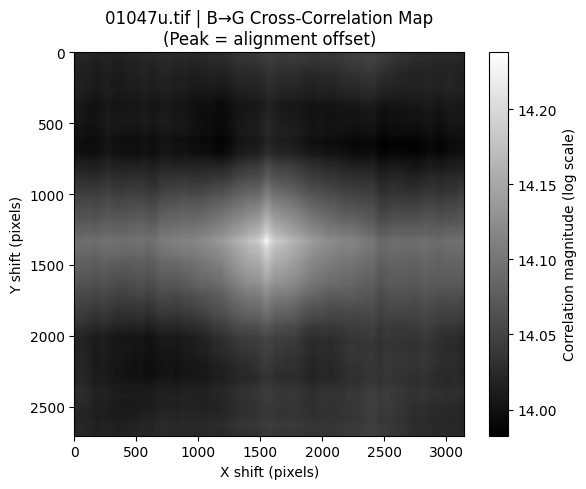

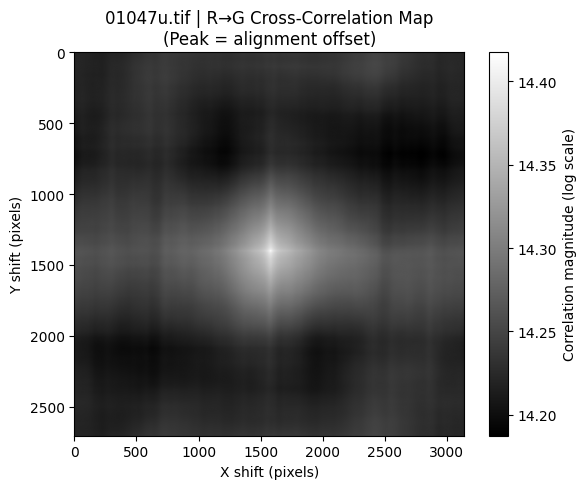

Time taken for high-resolution image alignment: 1.93 seconds


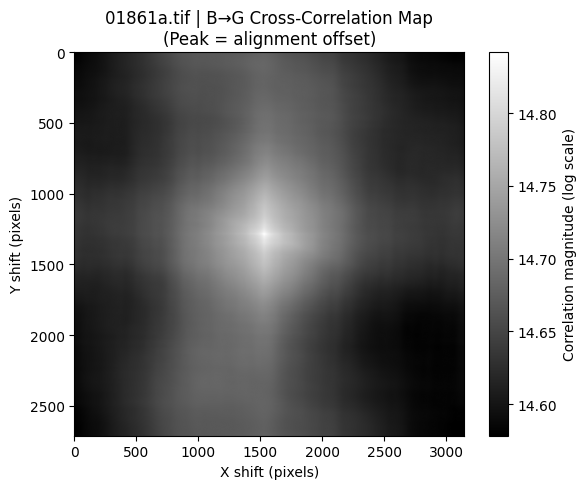

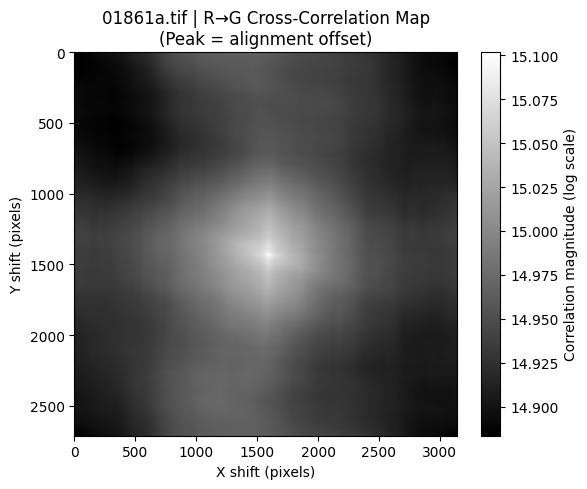

Time taken for high-resolution image alignment: 2.23 seconds
01657u.tif shifts: {'B->G': (49, 9), 'R->G': (-62, -3)}


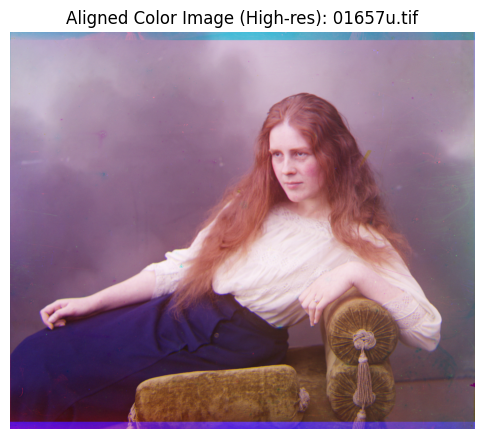

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/01657u_aligned.jpg
Time taken for high-resolution image alignment: 0.28 seconds
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/01657u_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/01657u_bottom_spectrum.png
01047u.tif shifts: {'B->G': (24, 20), 'R->G': (-47, -14)}


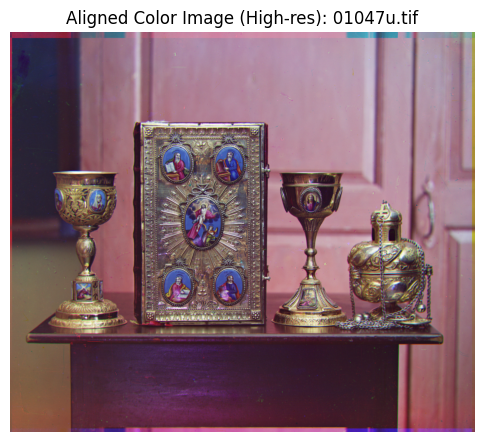

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/01047u_aligned.jpg
Time taken for high-resolution image alignment: 0.28 seconds
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/01047u_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/01047u_bottom_spectrum.png
01861a.tif shifts: {'B->G': (71, 39), 'R->G': (-77, -24)}


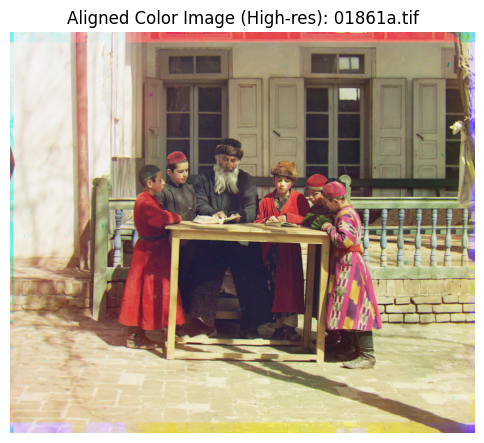

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/01861a_aligned.jpg
Time taken for high-resolution image alignment: 0.26 seconds
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/01861a_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/01861a_bottom_spectrum.png


In [8]:
# Align and form color images for high-resolution images
aligned_high_res_images, high_res_shifts, high_res_spectra = align_and_form_color_images(
    high_res_slices, visualize_corr=True, image_filenames=image_files_high_res
)

# Get parent directory (one above current working directory)
parent_dir = os.path.dirname(os.getcwd())
output_dir = os.path.join(parent_dir, "Gen", "a2", "part1", "hires_rgb")
os.makedirs(output_dir, exist_ok=True)

# Display aligned high-resolution color images and their shifts
for i, color_image in enumerate(aligned_high_res_images):
    
    # Measure the time taken for alignment of high-resolution images
    start_time = time.time()
    
    plt.figure(figsize=(6,6))
    plt.imshow(color_image)
    plt.title(f"Aligned Color Image (High-res): {image_files_high_res[i]}")
    plt.axis('off')
    print(f"{image_files_high_res[i]} shifts:", high_res_shifts[i])
    plt.show()

    # Save RGB as .jpeg in Gen/a2/hires_rgb
    out_path = os.path.join(output_dir, f"{image_files_high_res[i].replace('.tif', '_aligned.jpg')}")
    out_img  = (color_image * 255).clip(0,255).astype(np.uint8)
    out_pil  = Image.fromarray(out_img)
    out_pil.save(out_path, format='JPEG')
    print(f"Saved: {out_path}")
    
    # Get the corresponding spectra
    top_spectrum, bottom_spectrum = high_res_spectra[i]

    end_time = time.time()
    print(f"Time taken for high-resolution image alignment: {end_time - start_time:.2f} seconds")
    
    # Save correlation spectrum as PNG with axes and colorbar (Top→Mid)
    plt.figure(figsize=(6,5))
    plt.imshow(top_spectrum, cmap='gray', aspect='auto')
    plt.title(f"B->G Shift: {high_res_shifts[i]['B->G']} Cross-Correlation\n(Peak = alignment offset)")
    plt.xlabel("X shift (pixels)")
    plt.ylabel("Y shift (pixels)")
    plt.colorbar(label="Correlation magnitude (log scale)")
    plt.tight_layout()
    png_path = os.path.join(output_dir, f"{image_files_high_res[i].replace('.tif', '_top_spectrum.png')}")
    plt.savefig(png_path)
    plt.close()
    print(f"Saved Top Spectrum: {png_path}")

    # Save correlation spectrum as PNG with axes and colorbar (Bottom→Mid)
    plt.figure(figsize=(6,5))
    plt.imshow(bottom_spectrum, cmap='gray', aspect='auto')
    plt.title(f"R->G Shift: {high_res_shifts[i]['R->G']} Cross-Correlation\n(Peak = alignment offset)")
    plt.xlabel("X shift (pixels)")
    plt.ylabel("Y shift (pixels)")
    plt.colorbar(label="Correlation magnitude (log scale)")
    plt.tight_layout()
    png_path = os.path.join(output_dir, f"{image_files_high_res[i].replace('.tif', '_bottom_spectrum.png')}")
    plt.savefig(png_path)
    plt.close()
    print(f"Saved Bottom Spectrum: {png_path}")

### Color Channel Preprocessing
- There are faulty alignments in the aligned color imaged (especially along the edges)
- To adress this issue apply a small Laplacian of Gaussian filter to highlight edges in each color channel

In [9]:
def preprocess_channel(channel, mode="log", sigma=1.0, amount=1.0):
    """
    Function that preprocess color channel prior to alignment.
    Parameters:
        log: Applies Laplacian of Gaussian (edge emphasis).
        unsharp: Applies mild sharpening. 
        mode: 'log', 'unsharp', or 'none'.
        sigma: Standard deviation for Gaussian kernel.
        amount: Amount of sharpening for unsharp masking.
    Returns: 
     - Preprocessed channel.
    """
    # Ensure input is float32
    channel_f = channel.astype(np.float32, copy=False)
    if mode == "log":
        # Laplacian of Gaussian for edge emphasis
        return np.abs(gaussian_laplace(channel_f, sigma=sigma))
    elif mode == "unsharp":
        # Unsharp masking for sharpening
        blur = gaussian_filter(channel_f, sigma=sigma)
        return channel_f + amount * (channel_f - blur)
    else:
        # No preprocessing
        return channel_f

In [10]:
def crop_slice(channel, border_percent=0.05):
    """
    Function to crop borders from a channel.
    Parameters:
        channel: 2D numpy array.
        border_percent: Percentage of border to crop from each side.
    Returns: 
        Cropped channel.s
    """
    height, width = channel.shape
    # Calculate pixels to crop
    bh = int(height * border_percent)
    bw = int(width * border_percent)
    
    return channel[bh:height-bh, bw:width-bw]

In [11]:
# Re-define the align_and_form_color_images function to include preprocessing
def align_and_form_color_images_with_preprocessing(
        slices_list, 
        preprocess="log",
        sigma=1.0, 
        visualize_corr=False,
        image_filenames=None):
    """
    Function that:
     - Preprocesses channels.
     - Aligns the top and bottom slices to the middle slice.
     - Stacks them into RGB images.
    Parameters:
        slices_list: List of tuples (top, middle, bottom).
        preprocess: Preprocessing mode ('log', 'unsharp', 'none').
        sigma: Standard deviation for Gaussian kernel in preprocessing.
        visualize_corr: Flag to visualize correlation maps during alignment.
    Returns:
        color_images: List of aligned RGB images.
        shifts: List of dictionaries with shifts applied for each image.
    """
    color_images = []
    shifts   = []
    spectra = []
    
    # As seen in the previous run without preprocessing, there are significant misalignments,
    # especially along the borders and textured regions. Cropping out an extra 3-5% from each side
    # before channel pre-processing and alignment can help reduce border artifacts and improve results.
    
    # For each (top, middle, bottom):
    for i, (top, middle, bottom) in enumerate(slices_list):

        # Measure the time taken for alignment of high-resolution images
        start_time = time.time()
        
        # Perform preprocessing on each channel
        top_pre    = preprocess_channel(top,    mode=preprocess, sigma=2.0)
        middle_pre = preprocess_channel(middle, mode=preprocess, sigma=2.0)
        bottom_pre = preprocess_channel(bottom, mode=preprocess, sigma=2.0)

        # Use filename if provided, else fallback to index
        if image_filenames is not None:
            img_name = image_filenames[i]
        else:
            img_name = f"Image {i+1}"

        # Pass filename to title_prefix
        (shift_top, top_spectrum) = fourier_shift_correlation(
            middle_pre, top_pre, visualize_corr=visualize_corr, 
            title_prefix=f"{img_name} | B→G"
        )
        (shift_bottom, bottom_spectrum) = fourier_shift_correlation(
            middle_pre, bottom_pre, visualize_corr=visualize_corr, 
            title_prefix=f"{img_name} | R→G"
        )

        # Extract shifts
        dy_b, dx_b = shift_top
        dy_r, dx_r = shift_bottom

        # Apply the shifts
        # Use np.roll to shift the channels by the computed displacements
        top_aligned    = np.roll(top,    shift=(-dy_b, -dx_b), axis=(0,1))
        bottom_aligned = np.roll(bottom, shift=(-dy_r, -dx_r), axis=(0,1))
        middle_aligned = middle

        # Stack into RGB (bottom=R, middle=G, top=B)
        # From assignment1 we already know the channel order
        rgb = np.dstack([bottom_aligned, middle_aligned, top_aligned])

        # Crop the final RGB image
        H, W, _ = rgb.shape
        bh = int(H * 0.05)
        bw = int(W * 0.05)
        rgb_cropped = rgb[bh:H-bh, bw:W-bw, :]

        # Append the RGB image to the list
        color_images.append(rgb_cropped)
        # Append the shifts to the list
        shifts.append({"B->G": (dy_b, dx_b), "R->G": (dy_r, dx_r)})
        # Append the spectra for potential further analysis
        spectra.append((top_spectrum, bottom_spectrum))

        end_time = time.time()
        print(f"Time taken for image alignment: {end_time - start_time:.2f} seconds")
    
    # Return the color images and shifts
    return color_images, shifts, spectra

### Color Image Alginment for Low-Resolution Images with Channel Pre-Processing

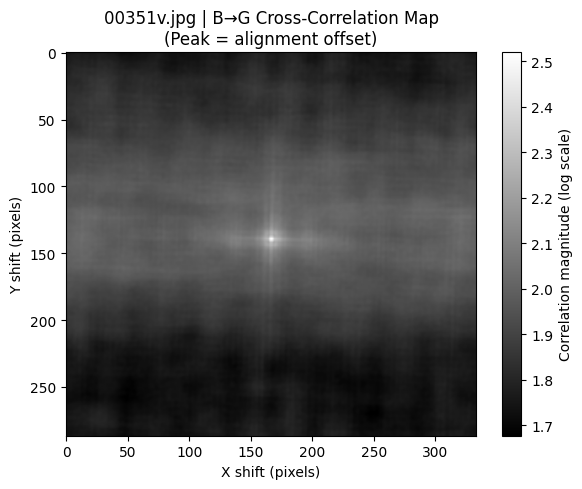

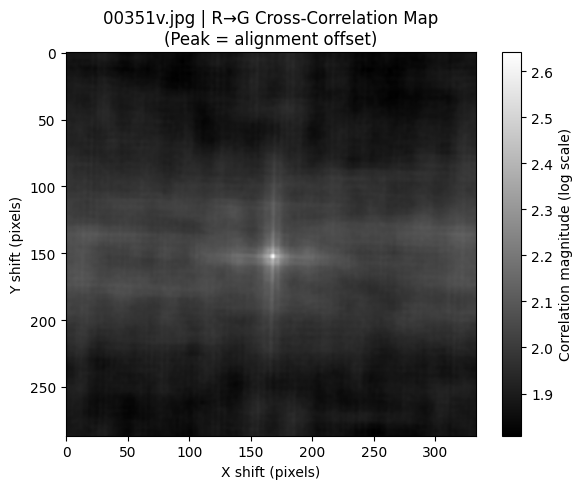

Time taken for image alignment: 0.14 seconds


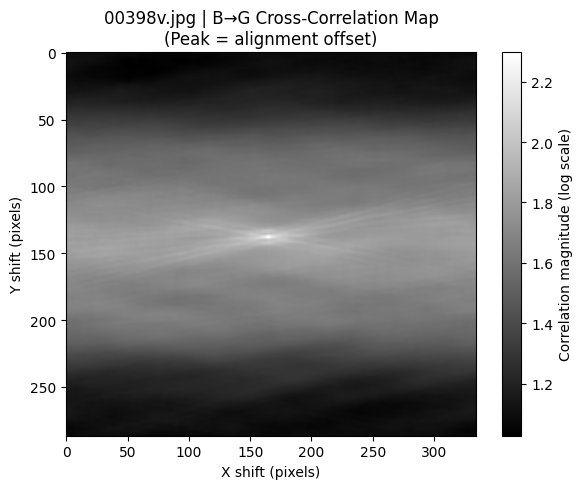

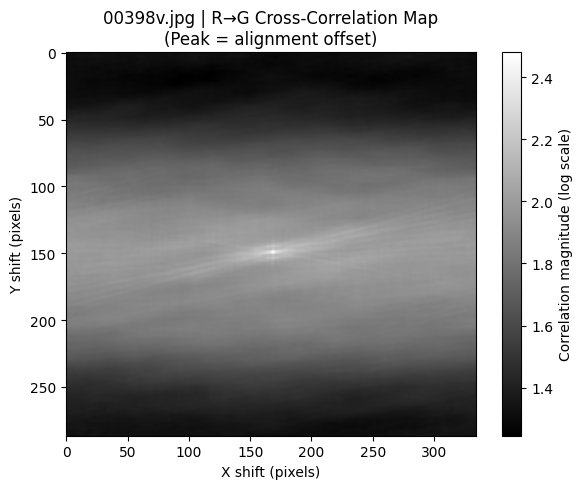

Time taken for image alignment: 0.13 seconds


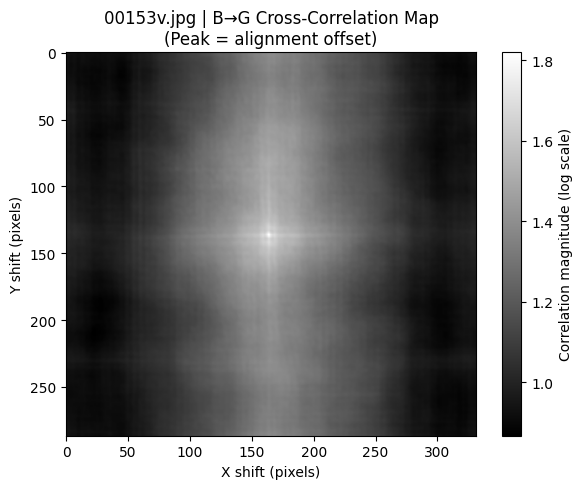

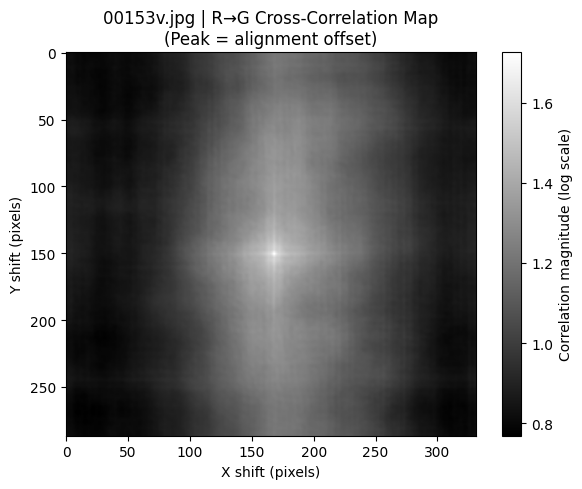

Time taken for image alignment: 0.17 seconds


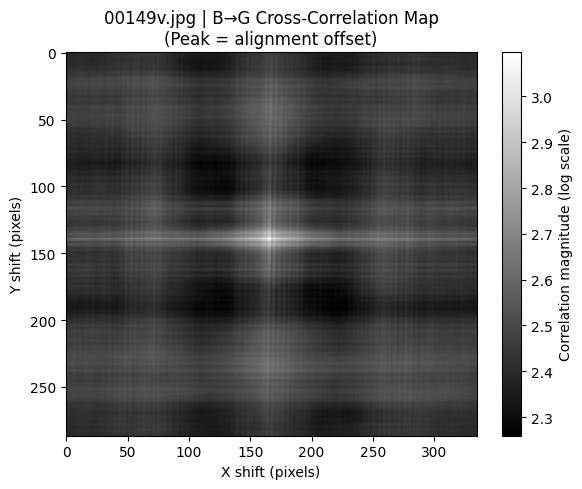

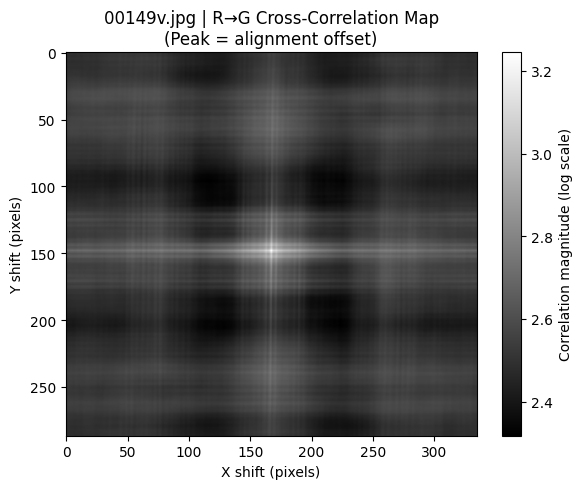

Time taken for image alignment: 0.14 seconds


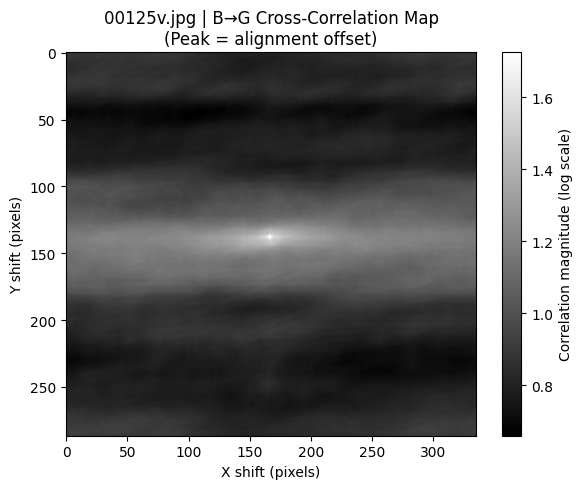

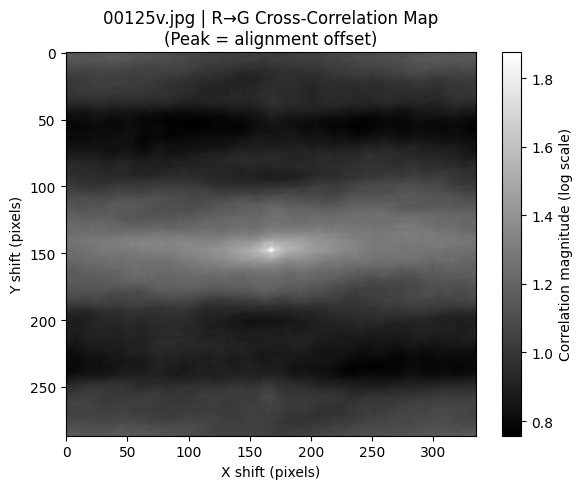

Time taken for image alignment: 0.13 seconds


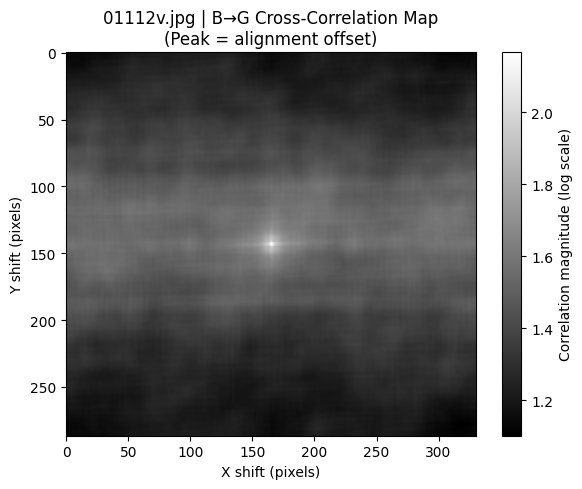

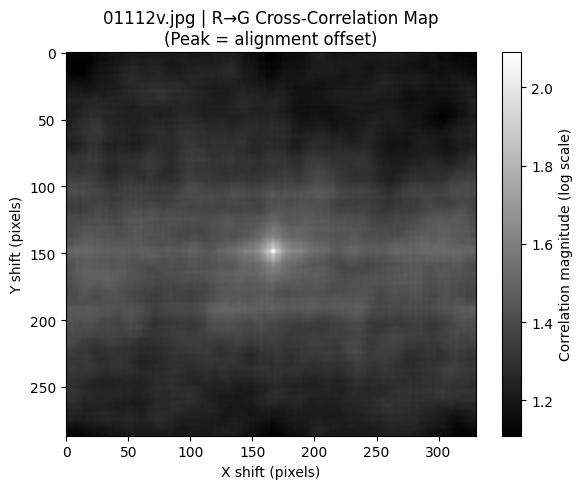

Time taken for image alignment: 0.14 seconds
00351v.jpg shifts: {'B->G': (4, 1), 'R->G': (-9, -1)}


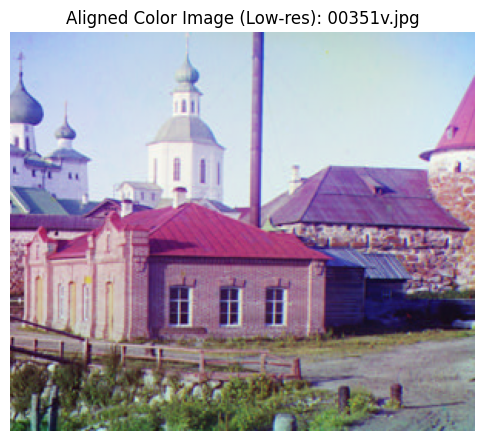

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00351v_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00351v_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00351v_bottom_spectrum.png
00398v.jpg shifts: {'B->G': (5, 3), 'R->G': (-6, -1)}


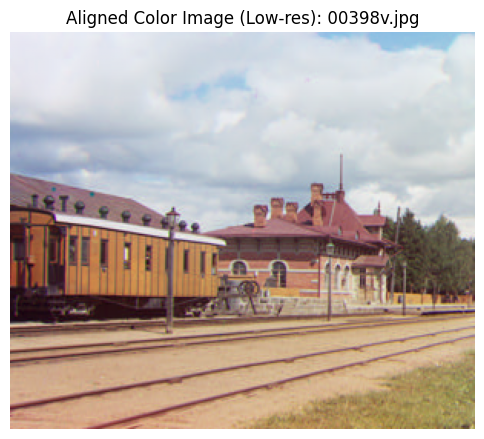

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00398v_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00398v_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00398v_bottom_spectrum.png
00153v.jpg shifts: {'B->G': (7, 3), 'R->G': (-7, -2)}


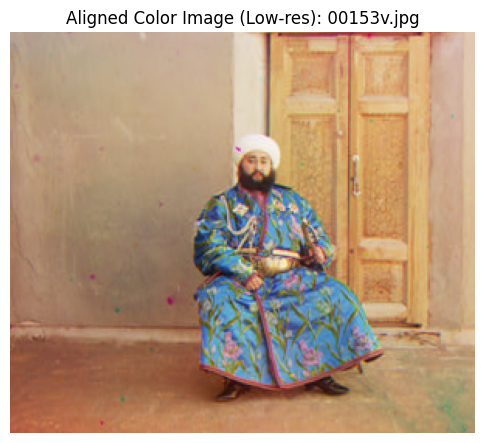

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00153v_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00153v_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00153v_bottom_spectrum.png
00149v.jpg shifts: {'B->G': (4, 2), 'R->G': (-5, 0)}


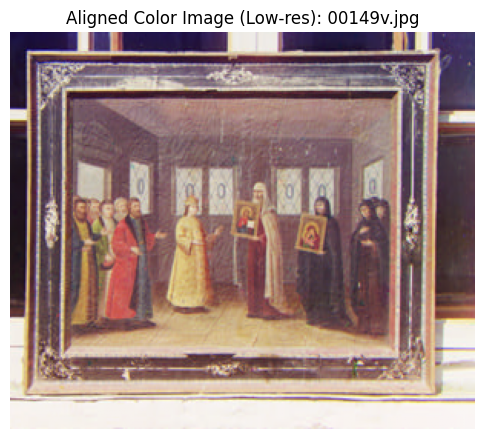

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00149v_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00149v_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00149v_bottom_spectrum.png
00125v.jpg shifts: {'B->G': (5, 2), 'R->G': (-4, 1)}


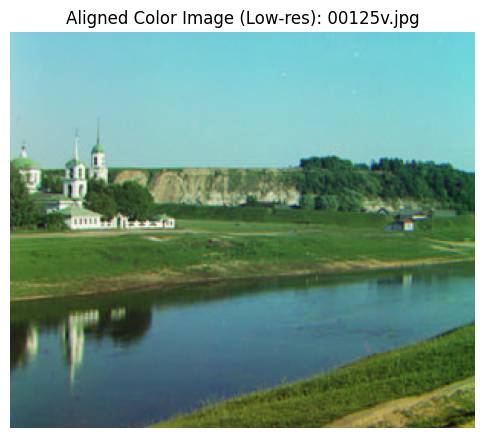

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00125v_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00125v_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/00125v_bottom_spectrum.png
01112v.jpg shifts: {'B->G': (0, 0), 'R->G': (-5, -1)}


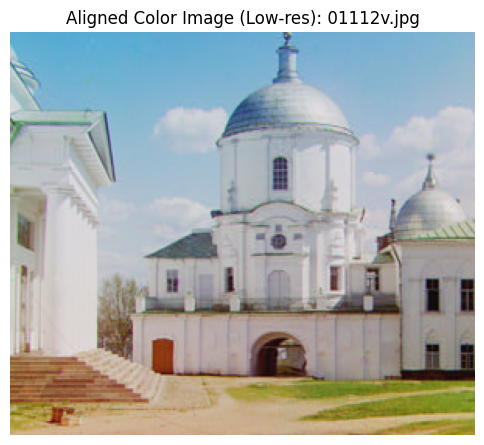

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/01112v_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/01112v_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/lowres_rgb/preprocessed/01112v_bottom_spectrum.png


In [12]:
# Align and form color images for low-resolution images with preprocessing
aligned_low_res_images, low_res_shifts, low_res_spectra = align_and_form_color_images_with_preprocessing(
    low_res_slices,
    preprocess="log",    
    sigma=1.0,
    visualize_corr=True,
    image_filenames=image_files_low_res
)

# Get parent directory (one above current working directory)
parent_dir = os.path.dirname(os.getcwd())
output_dir = os.path.join(parent_dir, "Gen", "a2", "part1", "lowres_rgb", "preprocessed")
os.makedirs(output_dir, exist_ok=True)

# Display aligned low-resolution color images and their shifts
for i, color_image in enumerate(aligned_low_res_images):
    plt.figure(figsize=(6,6))
    plt.imshow(color_image)
    plt.title(f'Aligned Color Image (Low-res): {image_files_low_res[i]}')
    plt.axis('off')
    print(f'{image_files_low_res[i]} shifts:', low_res_shifts[i])
    plt.show()

    # Save RGB as .jpeg in Gen/a2/lowres_rgb/preprocessed
    out_path = os.path.join(output_dir, f"{image_files_low_res[i].replace('.jpg', '_aligned.jpg')}")
    out_img  = (color_image * 255).clip(0,255).astype(np.uint8)
    out_pil  = Image.fromarray(out_img)
    out_pil.save(out_path, format='JPEG')
    print(f"Saved: {out_path}")
    
    # Get the corresponding spectra
    top_spectrum, bottom_spectrum = low_res_spectra[i]
    
    # Save correlation spectrum as PNG with axes and colorbar (Top→Mid)
    plt.figure(figsize=(6,5))
    plt.imshow(top_spectrum, cmap='gray', aspect='auto')
    plt.title(f"B->G Shift: {low_res_shifts[i]['B->G']} Cross-Correlation\n(Peak = alignment offset)\n{image_files_low_res[i]}")
    plt.xlabel("X shift (pixels)")
    plt.ylabel("Y shift (pixels)")
    plt.colorbar(label="Correlation magnitude (log scale)")
    plt.tight_layout()
    png_path = os.path.join(output_dir, f"{image_files_low_res[i].replace('.jpg', '_top_spectrum.png')}")
    plt.savefig(png_path)
    plt.close()
    print(f"Saved Top Spectrum: {png_path}")

    # Save correlation spectrum as PNG with axes and colorbar (Bottom→Mid)
    plt.figure(figsize=(6,5))
    plt.imshow(bottom_spectrum, cmap='gray', aspect='auto')
    plt.title(f"B->G Shift: {low_res_shifts[i]['B->G']} Cross-Correlation\n(Peak = alignment offset)\n{image_files_low_res[i]}")
    plt.xlabel("X shift (pixels)")
    plt.ylabel("Y shift (pixels)")
    plt.colorbar(label="Correlation magnitude (log scale)")
    plt.tight_layout()
    png_path = os.path.join(output_dir, f"{image_files_low_res[i].replace('.jpg', '_bottom_spectrum.png')}")
    plt.savefig(png_path)
    plt.close()
    print(f"Saved Bottom Spectrum: {png_path}")

### Color Image Alginment for High-Resolution Images with Channel Pre-Processing

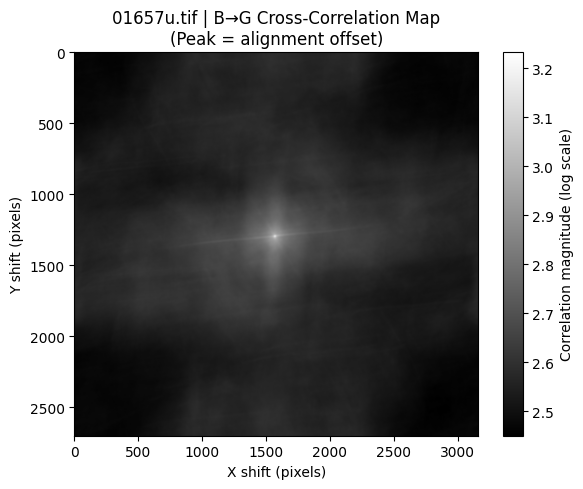

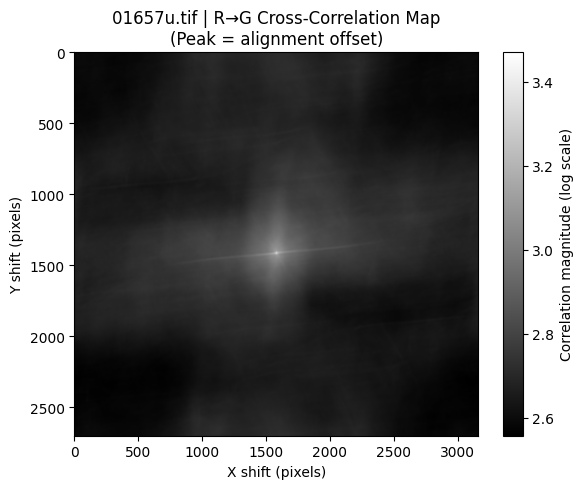

Time taken for image alignment: 2.18 seconds


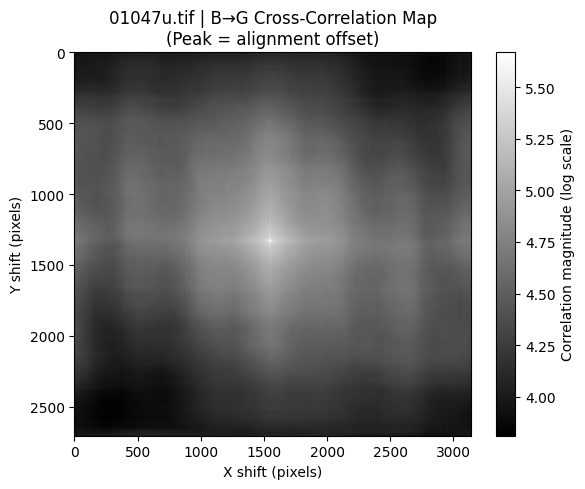

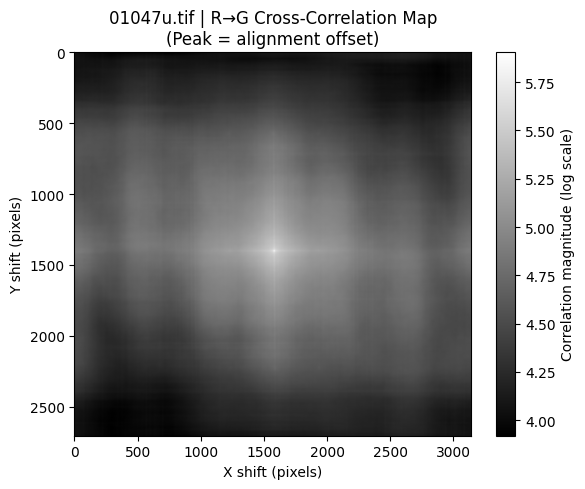

Time taken for image alignment: 2.33 seconds


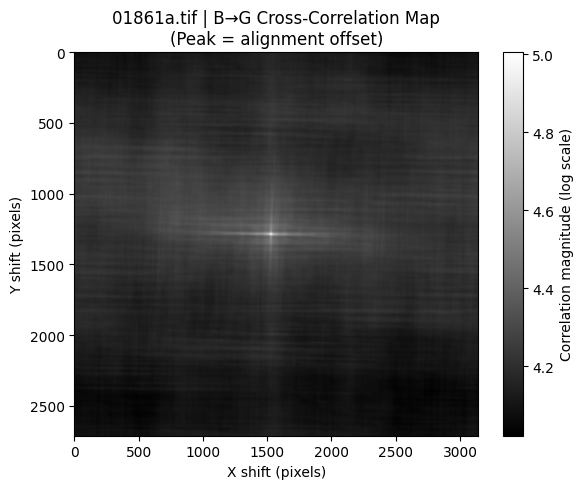

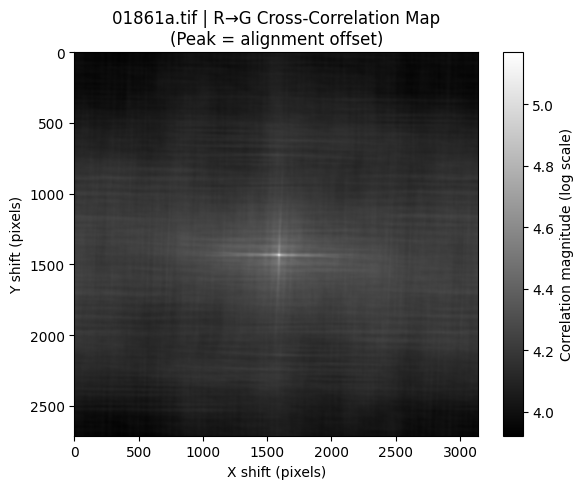

Time taken for image alignment: 2.80 seconds
01657u.tif shifts: {'B->G': (57, 9), 'R->G': (-63, -3)}


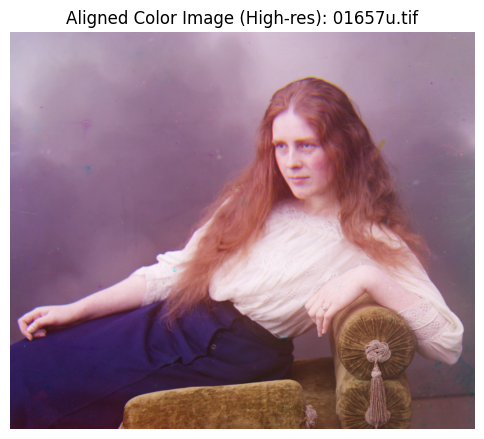

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/preprocessed/01657u_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/preprocessed/01657u_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/preprocessed/01657u_bottom_spectrum.png
01047u.tif shifts: {'B->G': (25, 19), 'R->G': (-47, -14)}


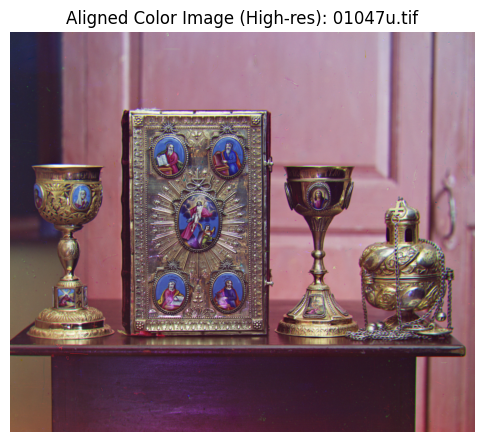

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/preprocessed/01047u_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/preprocessed/01047u_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/preprocessed/01047u_bottom_spectrum.png
01861a.tif shifts: {'B->G': (72, 40), 'R->G': (-77, -23)}


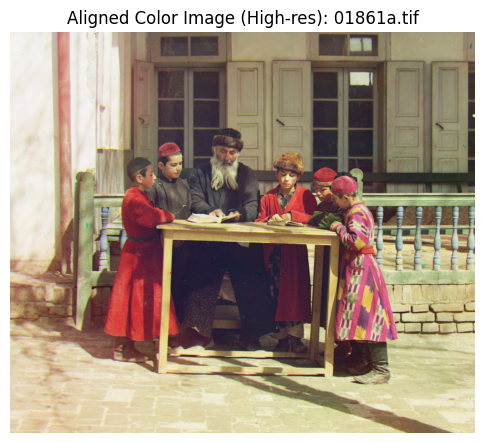

Saved: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/preprocessed/01861a_aligned.jpg
Saved Top Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/preprocessed/01861a_top_spectrum.png
Saved Bottom Spectrum: /Users/rashiqul/Documents/Workspace/ece549/Gen/a2/part1/hires_rgb/preprocessed/01861a_bottom_spectrum.png


In [13]:
# Align and form color images for high-res images with preprocessing
aligned_high_res_images, high_res_shifts, high_res_spectra = align_and_form_color_images_with_preprocessing(
    high_res_slices,
    preprocess="log",    
    sigma=1.0,
    visualize_corr=True,
    image_filenames=image_files_high_res
)

# Get parent directory (one above current working directory)
parent_dir = os.path.dirname(os.getcwd())
output_dir = os.path.join(parent_dir, "Gen", "a2", "part1", "hires_rgb", "preprocessed")
os.makedirs(output_dir, exist_ok=True)

for i, color_image in enumerate(aligned_high_res_images):
    plt.figure(figsize=(6,6))
    plt.imshow(color_image)
    plt.title(f'Aligned Color Image (High-res): {image_files_high_res[i]}')
    plt.axis('off')
    print(f'{image_files_high_res[i]} shifts:', high_res_shifts[i])
    plt.show()

    # Save RGB as .jpeg in Gen/a2/hires_rgb/preprocessed
    out_path = os.path.join(output_dir, f"{image_files_high_res[i].replace('.tif', '_aligned.jpg')}")
    out_img  = (color_image * 255).clip(0,255).astype(np.uint8)
    out_pil  = Image.fromarray(out_img)
    out_pil.save(out_path, format='JPEG')
    print(f"Saved: {out_path}")
    
    # Get the corresponding spectra
    top_spectrum, bottom_spectrum = high_res_spectra[i]
    
    # Save correlation spectrum as PNG with axes and colorbar (Top→Mid)
    plt.figure(figsize=(6,5))
    plt.imshow(top_spectrum, cmap='gray', aspect='auto')
    plt.title(f"B->G Shift: {high_res_shifts[i]['B->G']} Cross-Correlation\n(Peak = alignment offset)\n{image_files_high_res[i]}")
    plt.xlabel("X shift (pixels)")
    plt.ylabel("Y shift (pixels)")
    plt.colorbar(label="Correlation magnitude (log scale)")
    plt.tight_layout()
    png_path = os.path.join(output_dir, f"{image_files_high_res[i].replace('.tif', '_top_spectrum.png')}")
    plt.savefig(png_path)
    plt.close()
    print(f"Saved Top Spectrum: {png_path}")

    # Save correlation spectrum as PNG with axes and colorbar (Bottom→Mid)
    plt.figure(figsize=(6,5))
    plt.imshow(bottom_spectrum, cmap='gray', aspect='auto')
    plt.title(f"B->G Shift: {high_res_shifts[i]['B->G']} Cross-Correlation\n(Peak = alignment offset)\n{image_files_high_res[i]}")
    plt.xlabel("X shift (pixels)")
    plt.ylabel("Y shift (pixels)")
    plt.colorbar(label="Correlation magnitude (log scale)")
    plt.tight_layout()
    png_path = os.path.join(output_dir, f"{image_files_high_res[i].replace('.tif', '_bottom_spectrum.png')}")
    plt.savefig(png_path)
    plt.close()
    print(f"Saved Bottom Spectrum: {png_path}")

